In [1]:
pip install ultralytics


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 796.9/796.9 kB 13.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-

In [2]:
!pip install roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.2/76.2 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.9 MB/s eta 0:00:00
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling chardet-5.2.0:
      Successfully uninstalled chardet-5.2.0


In [3]:
from ultralytics import YOLO
from roboflow import Roboflow


In [4]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="sxeDLKUQldC7TeZo3s7X")
project = rf.workspace("vials-counting-0zviz").project("vials-counting-iai8h")
version = project.version(6)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.49, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Vials-Counting-6 in yolov8:: 100%|██████████| 66/66 [00:00<00:00, 2269.96it/s]


In [5]:
# Build a new model from YAML, transfer pretrained weights to it and start
# training\
!yolo detect train data=/content/Vials-Counting-6/data.yaml model=yolov8m.yaml epochs=600 save=True imgsz=640 optimizer='auto'  resume=True plots=True amp=True


Ultralytics YOLOv8.2.49 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=/content/Vials-Counting-6/data.yaml, epochs=600, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=None, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=

In [11]:
import shutil

shutil.make_archive('600epoc_yolov8n_run_folder', 'zip', '/content/runs')

'/content/600epoc_yolov8n_run_folder.zip'

In [7]:
import os
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
!pip install patool

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.6/96.6 kB 3.2 MB/s eta 0:00:00


In [13]:
import os
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [14]:
!ls

600epoc_yolov8n_run_folder.zip	sample_data				       yolov8n.pt
drive				Vials-Counting-6
runs				Vials_counting_600epoc_yolov8n_run_folder.zip


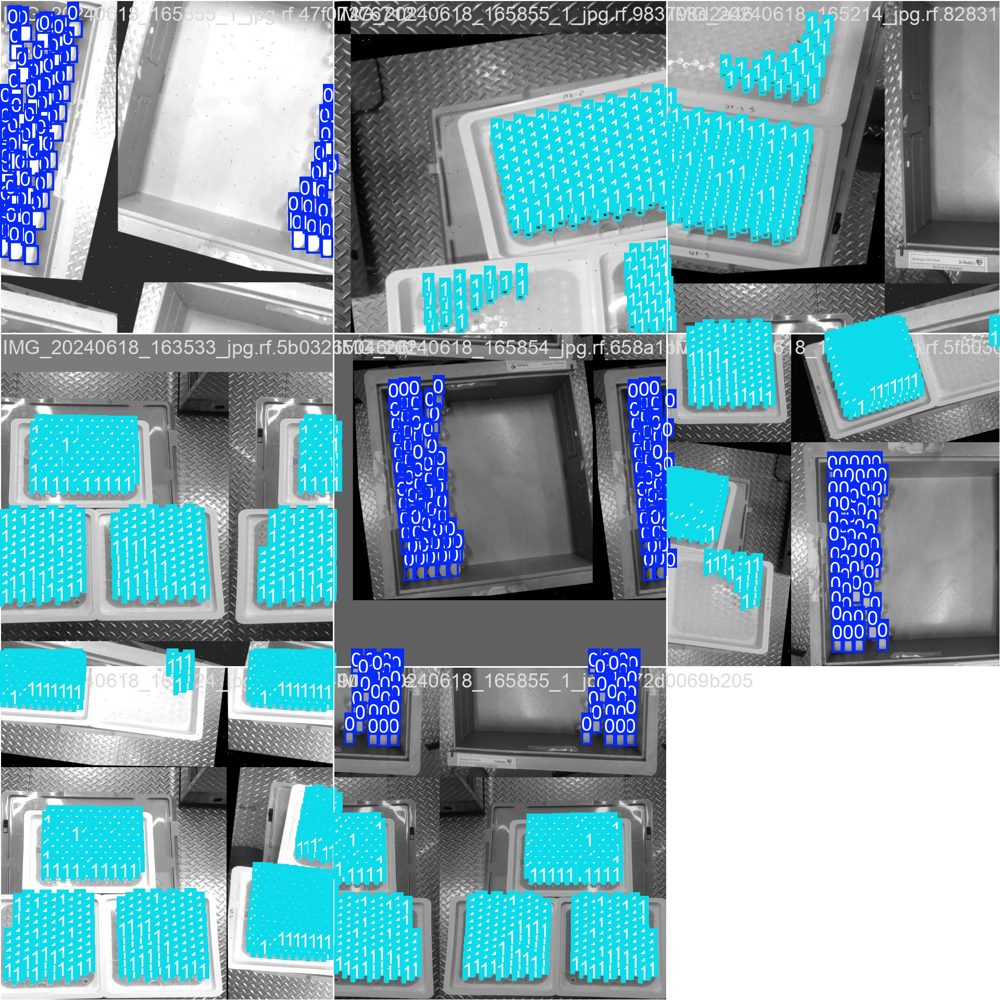

In [15]:
from IPython.display import Image

# Define the path to the train image file
train_path = '/content/runs/detect/train/train_batch1.jpg'

# Display the train image
Image(filename=train_path)

In [16]:
# Validation
!yolo detect val model=/content/runs/detect/train/weights/best.pt data=/content/Vials-Counting-6/data.yaml imgsz=640 save_json=True save_hybrid=True

Ultralytics YOLOv8.2.49 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m summary (fused): 218 layers, 25840918 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/Vials-Counting-6/valid/labels.cache... 2 images, 0 backgrounds, 0 corrupt: 100% 2/2 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:01<00:00,  1.16s/it]
                   all          2        292          1          1      0.995      0.995
                 Vials          1        125          1          1      0.995      0.995
               syringe          1        167          1          1      0.995      0.995
Speed: 73.4ms preprocess, 41.4ms inference, 0.0ms loss, 332.5ms postprocess per image
Saving runs/detect/val/predictions.json...
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


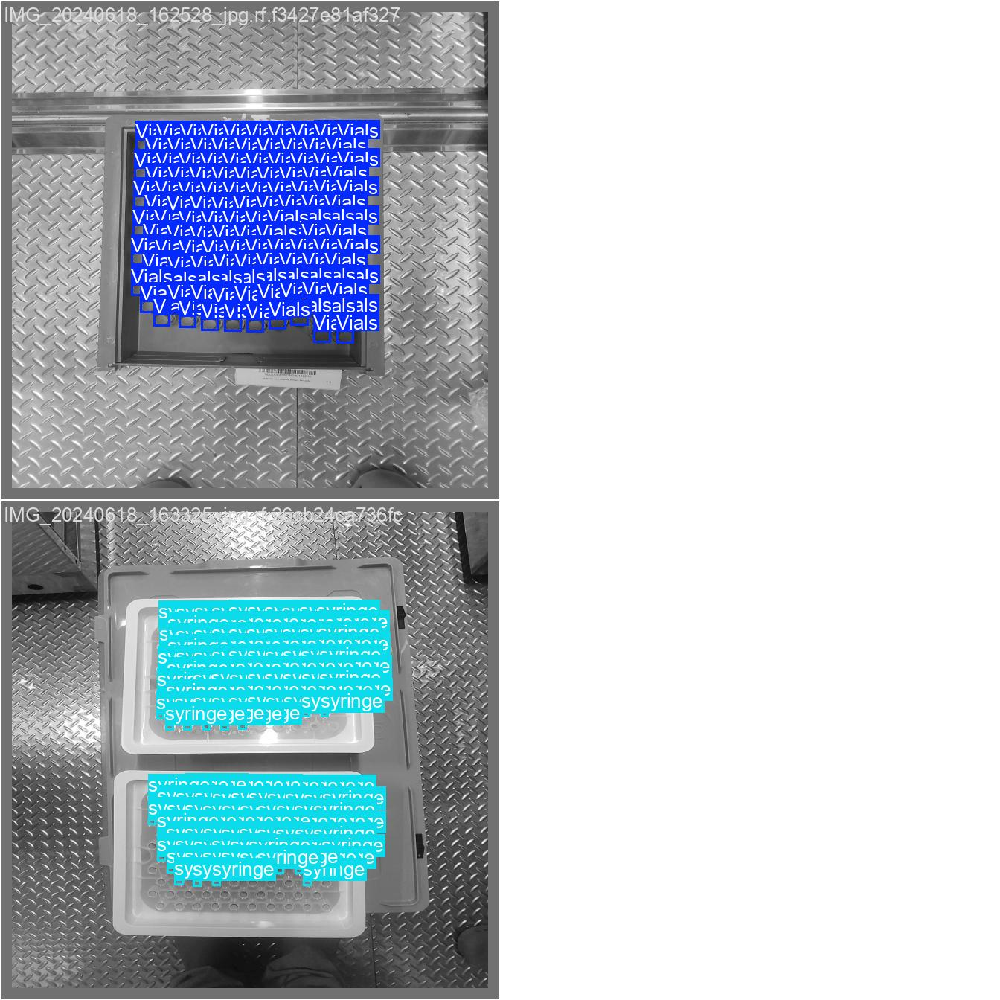

In [18]:
# Define the path to the train image file
valid_path = '/content/runs/detect/train/val_batch0_labels.jpg'


# Display the train image
Image(filename=valid_path)

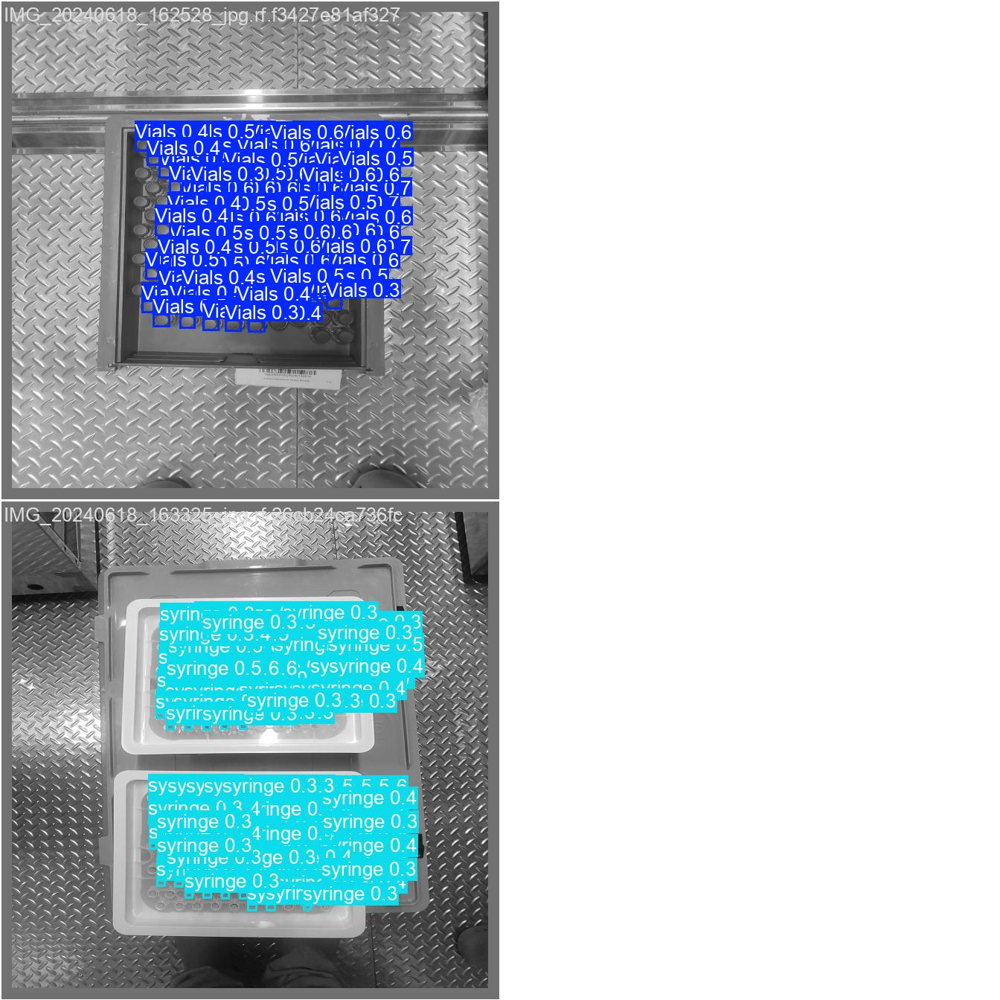

In [19]:
# Define the path to the train image file
valid_path = '/content/runs/detect/train/val_batch0_pred.jpg'

# Display the train image
Image(filename=valid_path)

In [20]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [21]:
!ls

drive  sample_data	 Vials_counting_600epoc_yolov8n_run_folder.zip
runs   Vials-Counting-6  yolov8n.pt


In [22]:
# Test
!yolo detect predict  model=/content/runs/detect/train/weights/best.pt conf=0.25 source=/content/Vials-Counting-6/test/images/IMG_20240618_171105_jpg.rf.c816ddd631a3fb793cebb0daf2b3b3af.jpg show=True save=True save_txt=True save_conf=True show_labels=True show_conf=True show_boxes=True

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()

Ultralytics YOLOv8.2.49 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m summary (fused): 218 layers, 25840918 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/Vials-Counting-6/test/images/IMG_20240618_171105_jpg.rf.c816ddd631a3fb793cebb0daf2b3b3af.jpg: 640x640 41 Vialss, 37.2ms
Speed: 3.1ms preprocess, 37.2ms inference, 518.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict
1 label saved to runs/detect/predict/labels
💡 Learn more at https://docs.ultralytics.com/modes/predict


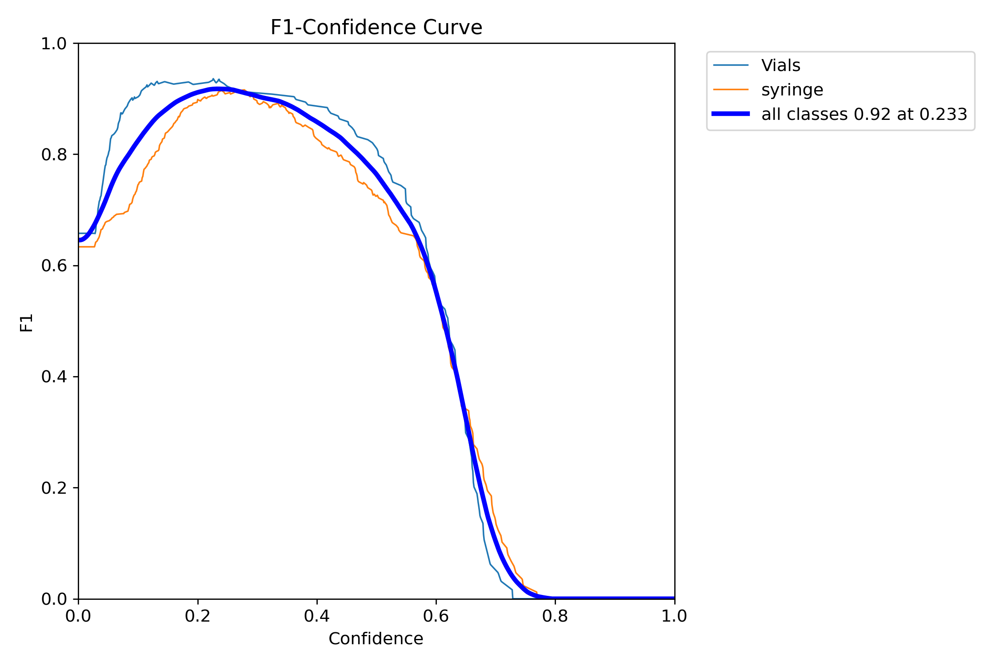

In [23]:
# Define the path to the F1_curve image file
f1_curve_path = '/content/runs/detect/train/F1_curve.png'

# Display the F1_curve image
Image(filename=f1_curve_path, width=640)

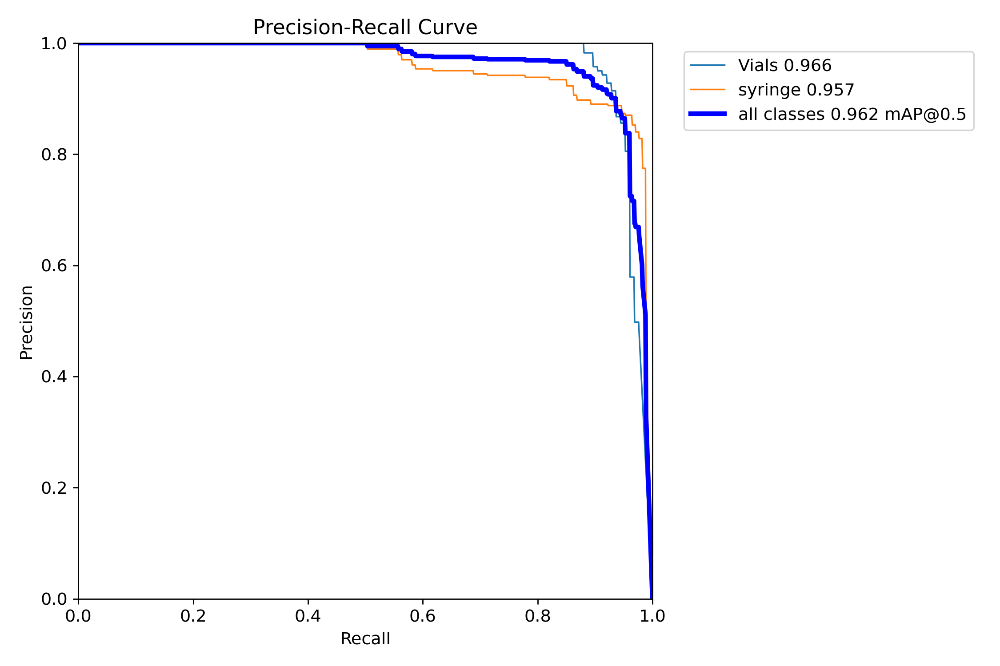

In [24]:
# Define the path to the PR curve image file
pr_curve_path = '/content/runs/detect/train/PR_curve.png'


Image(filename=pr_curve_path, width=640)

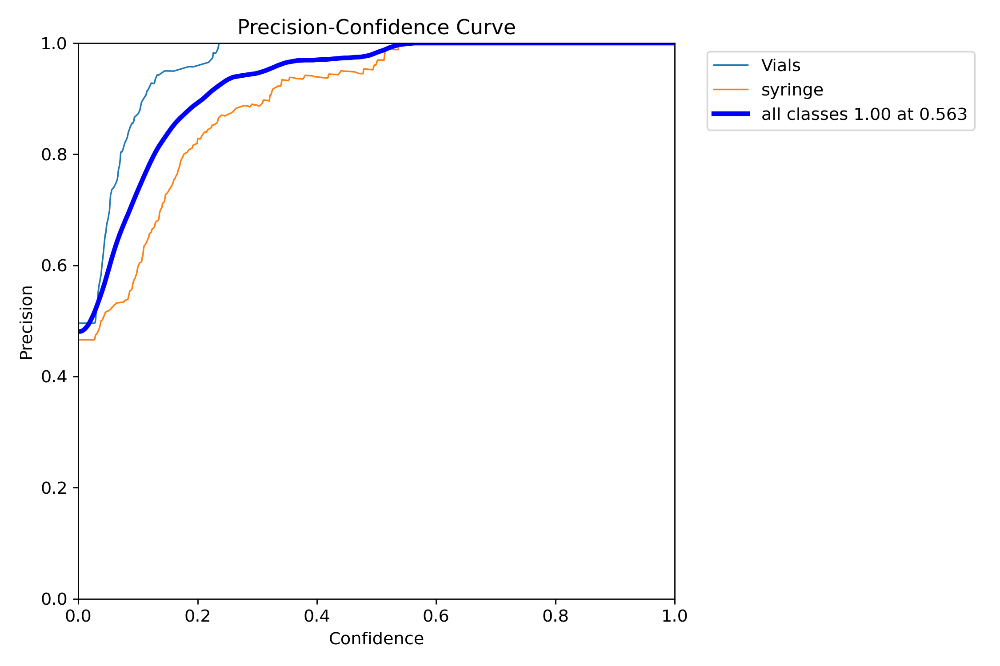

In [25]:
# Define the path to the P_curve image file
p_curve_path = '/content/runs/detect/train/P_curve.png'

# Display the P_curve image
Image(filename=p_curve_path, width=640)

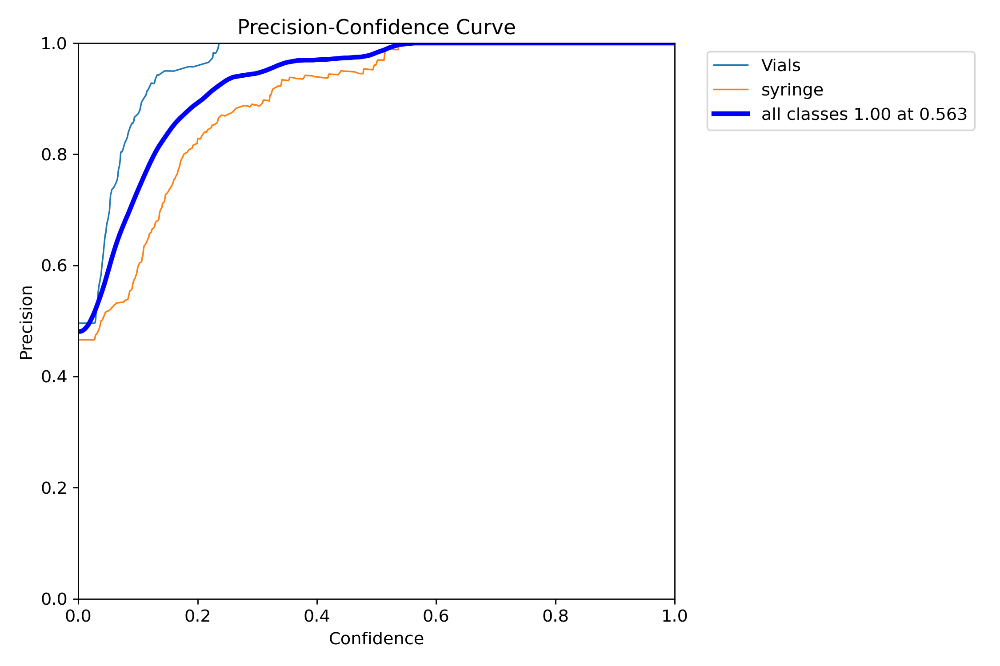

In [26]:
# Define the path to the P_curve image file
p_curve_path = '/content/runs/detect/train/P_curve.png'

# Display the P_curve image
Image(filename=p_curve_path, width=640)

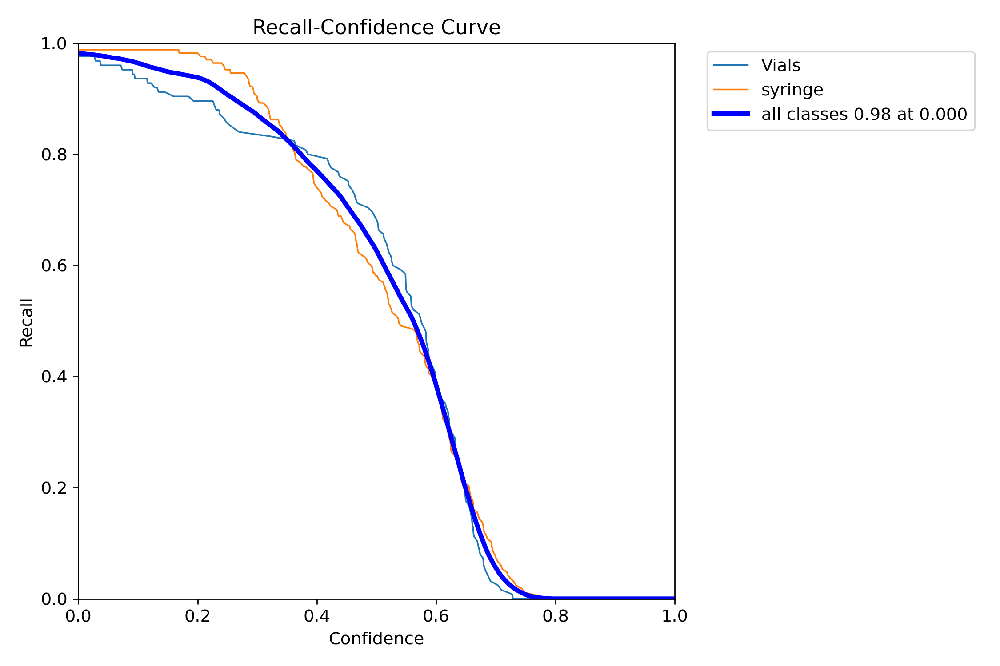

In [27]:
# Define the path to the R_curve image file
r_curve_path = '/content/runs/detect/train/R_curve.png'

# Display the R_curve image
Image(filename=r_curve_path, width=640)

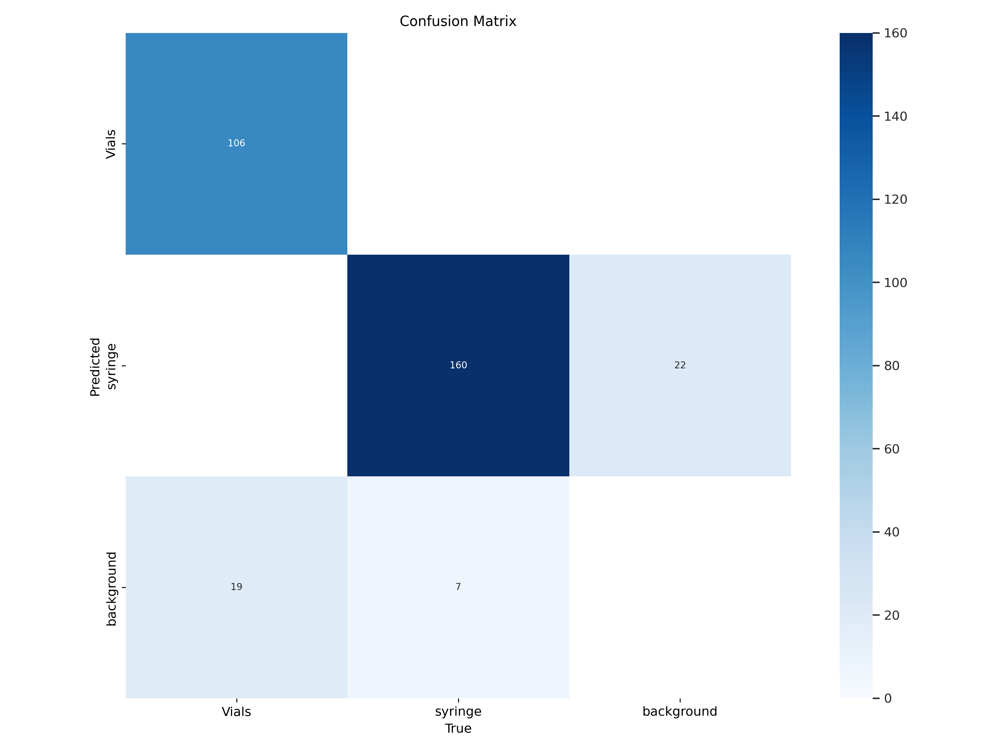

In [28]:
from IPython.display import Image

# Define the path to the confusion matrix image file
confusion_matrix_path = '/content/runs/detect/train/confusion_matrix.png'

# Display the confusion matrix image
Image(filename=confusion_matrix_path, width=640)

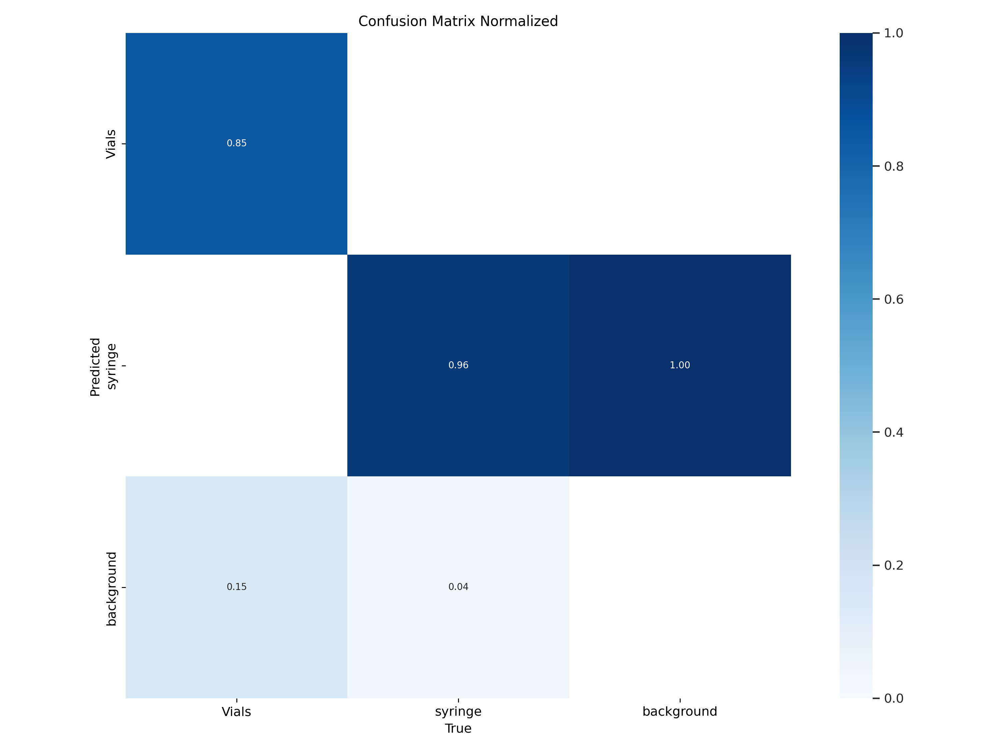

In [30]:
from IPython.display import Image

# Define the path to the confusion matrix image file
confusion_matrix_path = '/content/runs/detect/train/confusion_matrix_normalized.png'

# Display the confusion matrix image
Image(filename=confusion_matrix_path, width=640)

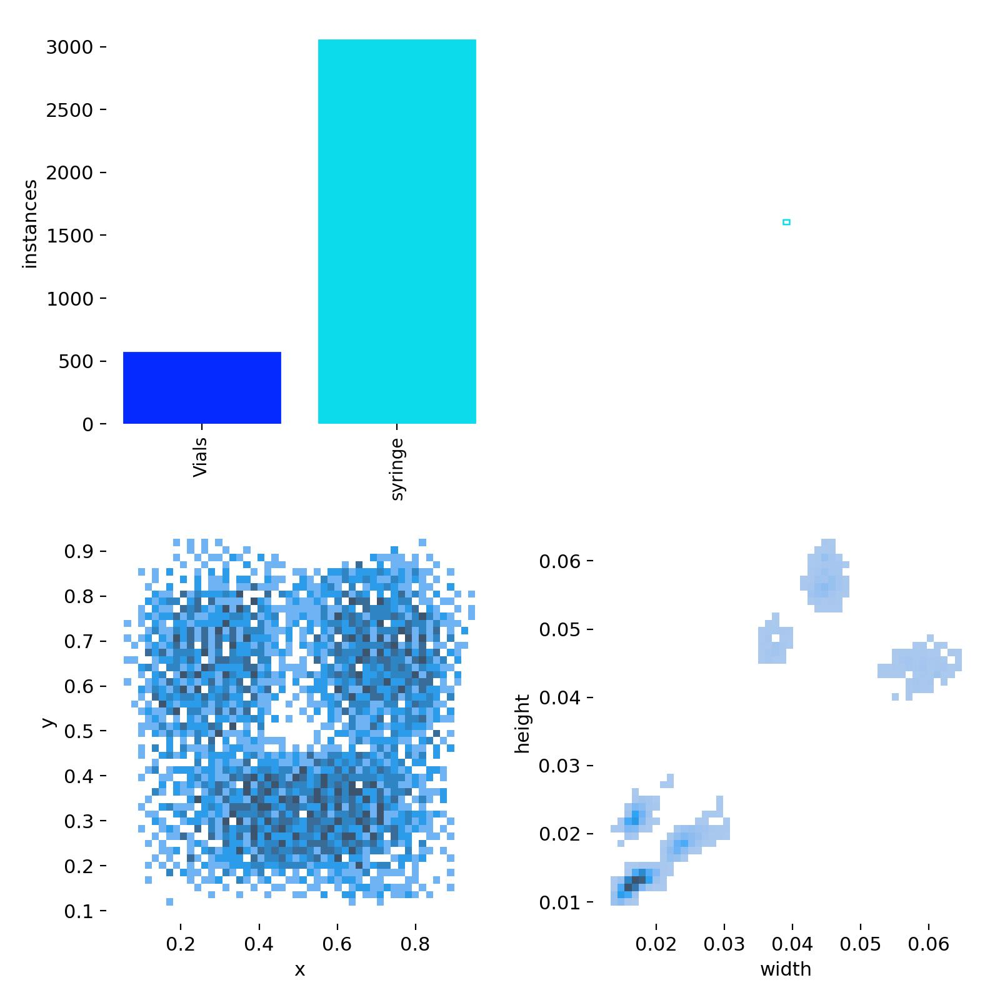

In [31]:
# Define the path to the labels image file
labels_path = '/content/runs/detect/train/labels.jpg'

# Display the labels image
Image(filename=labels_path, width=640)

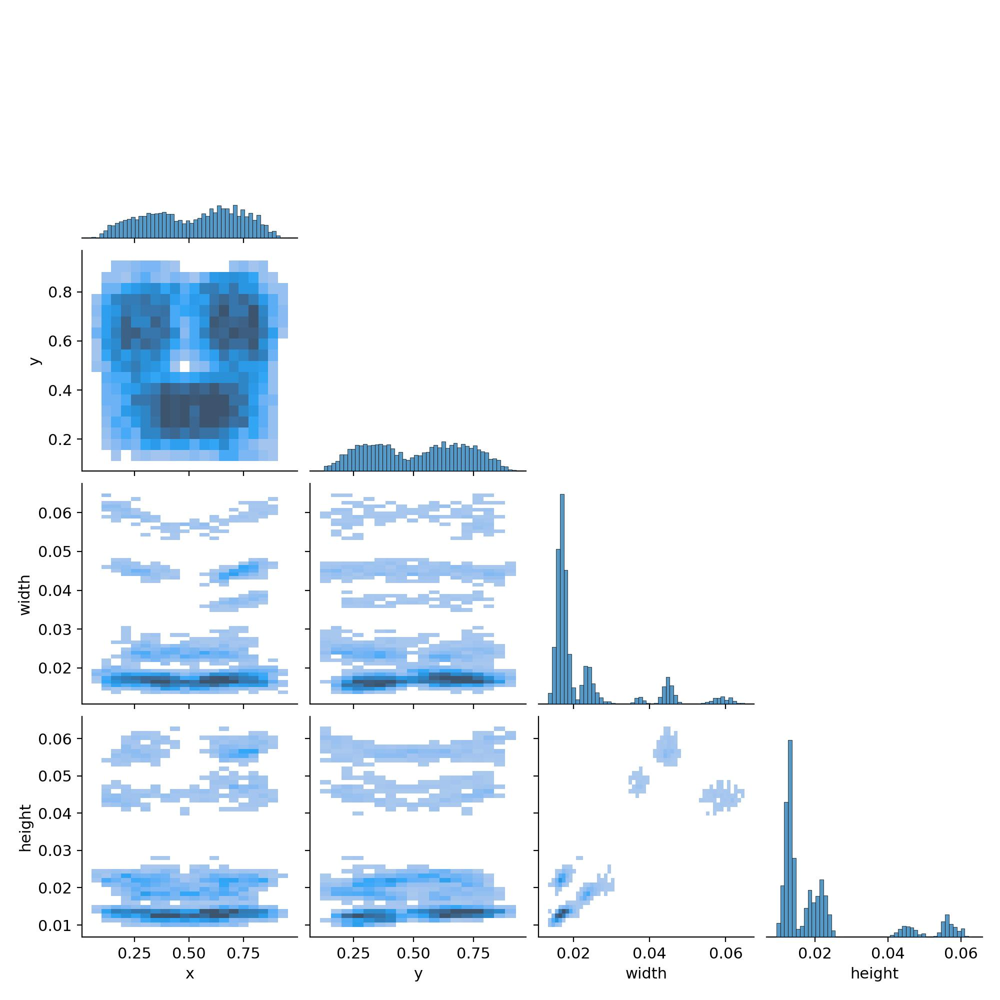

In [32]:
# Define the path to the labels_correlogram image file
labels_correlogram_path = '/content/runs/detect/train/labels_correlogram.jpg'

# Display the labels_correlogram image
Image(filename=labels_correlogram_path, width=820)

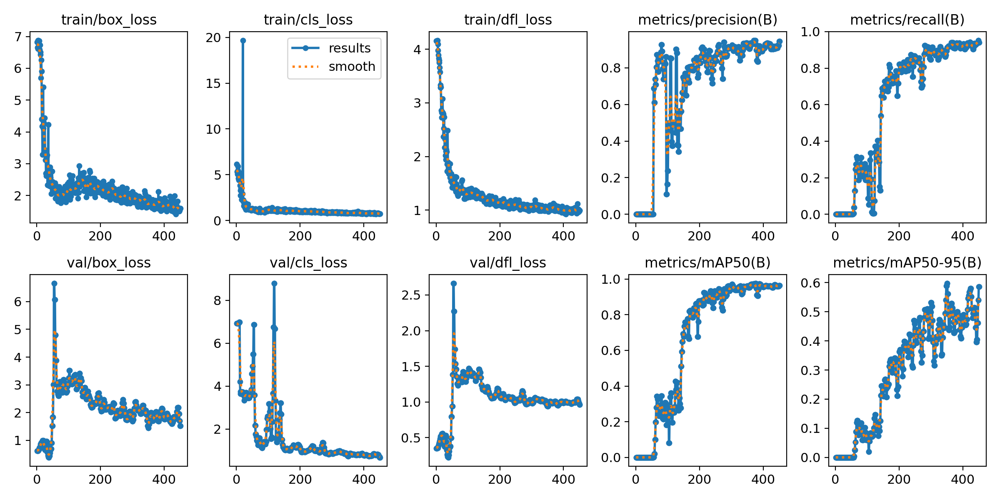

In [33]:
# Define the path to the Results image file
results = '/content/runs/detect/train/results.png'

# Display the results image
Image(filename=results)

In [34]:
# Test
!yolo detect predict  model=/content/runs/detect/train/weights/best.pt conf=0.25 source=/content/Vials-Counting-6/test/images show=True save=True save_txt=True save_conf=True show_labels=True show_conf=True show_boxes=True

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()

Ultralytics YOLOv8.2.49 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m summary (fused): 218 layers, 25840918 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/Vials-Counting-6/test/images/IMG_20240618_171105_jpg.rf.c816ddd631a3fb793cebb0daf2b3b3af.jpg: 640x640 41 Vialss, 37.2ms
Speed: 2.6ms preprocess, 37.2ms inference, 560.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2
1 label saved to runs/detect/predict2/labels
💡 Learn more at https://docs.ultralytics.com/modes/predict


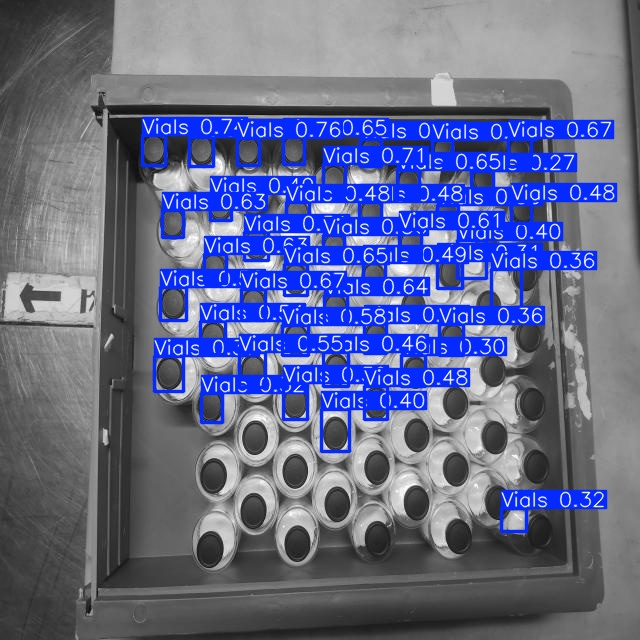

No more images to display after 1 samples.


In [35]:
from PIL import Image
from IPython.display import display
import os

# Define the directory containing the images
images_dir = '/content/runs/detect/predict'
# Get a list of image filenames, filtering out directories
image_files = [f for f in os.listdir(images_dir) if os.path.isfile(os.path.join(images_dir, f))]

# Display a few sample images
num_samples = 3  # Number of samples to display
for i in range(num_samples):
    try:
        # Get the image filename
        image_filename = image_files[i]

        # Define the path to the image file
        image_path = os.path.join(images_dir, image_filename)

        # Load the image
        image = Image.open(image_path)

        # Display the image
        display(image)
    except IndexError:
        print(f"No more images to display after {i} samples.")
        break
    except FileNotFoundError:
        print(f"File not found: {image_filename}, skipping to the next file.")
        continue
    except Exception as e: # Catch any other errors during image processing
        print(f"Error processing image {image_filename}: {e}")
        continue


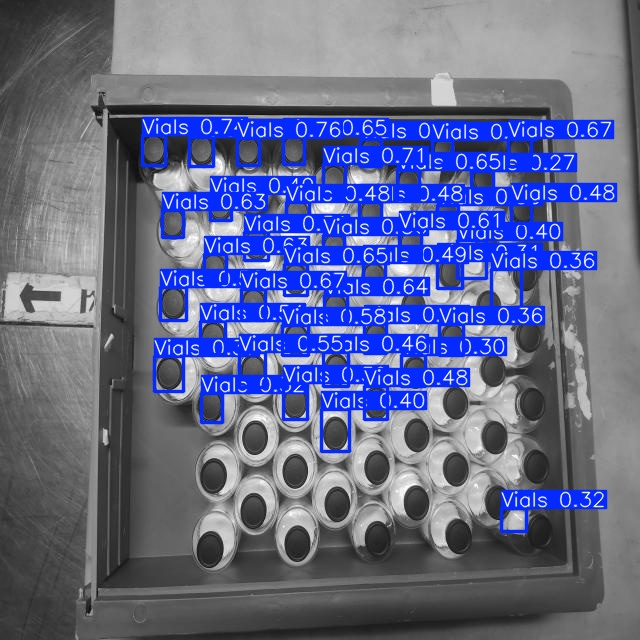

No more images to display after 1 samples.


In [36]:
from PIL import Image
from IPython.display import display
import os

# Define the directory containing the images
images_dir = '/content/runs/detect/predict2'
# Get a list of image filenames, filtering out directories
image_files = [f for f in os.listdir(images_dir) if os.path.isfile(os.path.join(images_dir, f))]

# Display a few sample images
num_samples = 3  # Number of samples to display
for i in range(num_samples):
    try:
        # Get the image filename
        image_filename = image_files[i]

        # Define the path to the image file
        image_path = os.path.join(images_dir, image_filename)

        # Load the image
        image = Image.open(image_path)

        # Display the image
        display(image)
    except IndexError:
        print(f"No more images to display after {i} samples.")
        break
    except FileNotFoundError:
        print(f"File not found: {image_filename}, skipping to the next file.")
        continue
    except Exception as e: # Catch any other errors during image processing
        print(f"Error processing image {image_filename}: {e}")
        continue

In [37]:
# Test with an image that the model has not seen before
!yolo detect predict model=/content/runs/detect/train/weights/best.pt source=/content/runs/detect/train/train_batch0.jpg conf=0.25 save_txt=True show_labels=True show_conf=True show_boxes=True visualize=True

Ultralytics YOLOv8.2.49 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m summary (fused): 218 layers, 25840918 parameters, 0 gradients, 78.7 GFLOPs

Saving runs/detect/predict3/train_batch0/stage0_Conv_features.png... (32/48)
Saving runs/detect/predict3/train_batch0/stage1_Conv_features.png... (32/96)
Saving runs/detect/predict3/train_batch0/stage2_C2f_features.png... (32/96)
Saving runs/detect/predict3/train_batch0/stage3_Conv_features.png... (32/192)
Saving runs/detect/predict3/train_batch0/stage4_C2f_features.png... (32/192)
Saving runs/detect/predict3/train_batch0/stage5_Conv_features.png... (32/384)
Saving runs/detect/predict3/train_batch0/stage6_C2f_features.png... (32/384)
Saving runs/detect/predict3/train_batch0/stage7_Conv_features.png... (32/576)
Saving runs/detect/predict3/train_batch0/stage8_C2f_features.png... (32/576)
Saving runs/detect/predict3/train_batch0/stage9_SPPF_features.png... (32/576)
Saving runs/detect/predict3/train_batch0/stage10_Upsampl

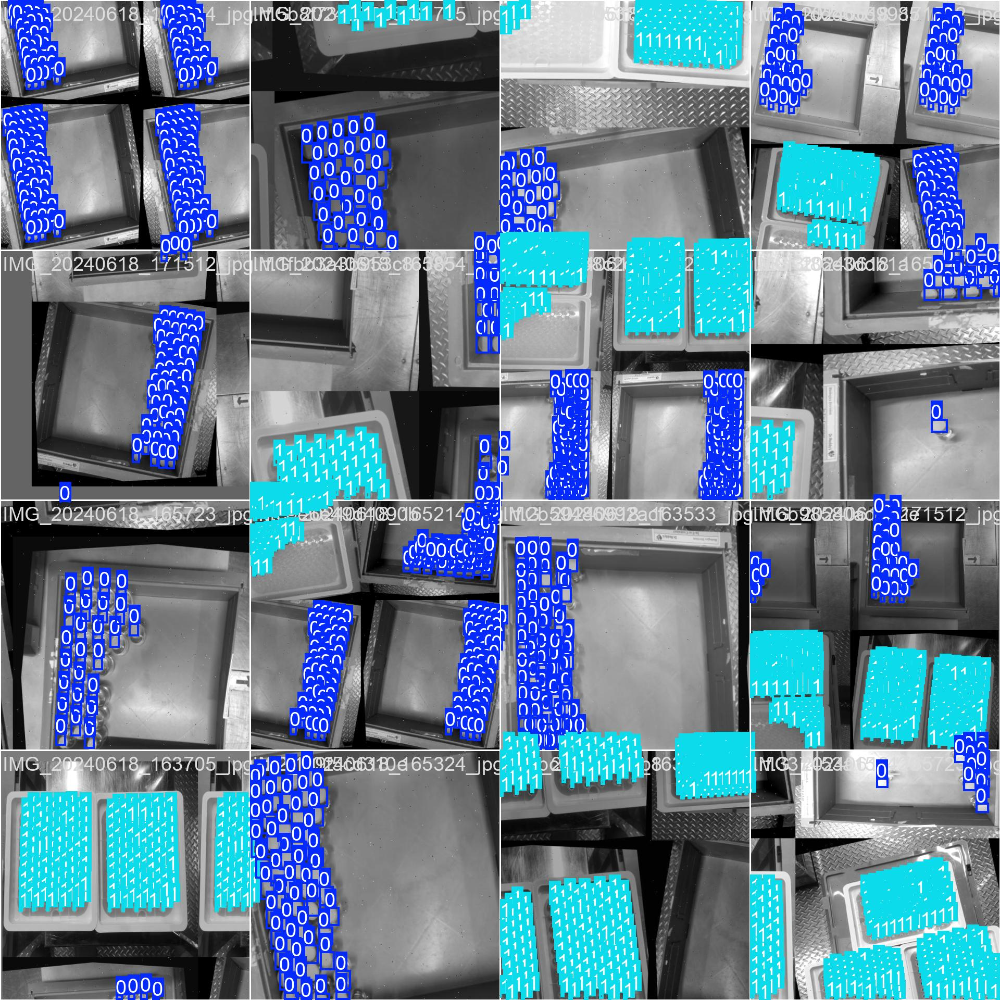

In [38]:
from PIL import Image
from IPython.display import display

image_path = '/content/runs/detect/train/train_batch0.jpg'
image = Image.open(image_path)

# Display the image in the notebook
display(image)